# **House Pricing Regression Prediction**

# **Import Libary and Dataset**

In [ ]:
# number wrangling and data manipulation libraries
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
sns.set_style("darkgrid")
plt.style.use('ggplot')

#preprocess
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

#model
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from mlxtend.regressor import StackingCVRegressor
import lightgbm as lgb
from sklearn.ensemble import RandomForestRegressor

#metrics
import sklearn.metrics as metrics
import math
from sklearn.metrics import classification_report, f1_score


# warnings
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
train = pd.read_csv('train.csv', index_col=0)
test = pd.read_csv('test.csv', index_col=0)

print("train: ", train.shape)
print("test: ", test.shape)
train.head()

train:  (1460, 80)
test:  (1459, 79)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


# **Exploratory Data Analysis**

## Join Data Train and Test

In [ ]:
df = pd.concat([train.drop("SalePrice", axis=1),test], axis=0)
df_y = train[['SalePrice']]

In [ ]:
df_numeric = df.select_dtypes(exclude=['object']).drop(['MSSubClass'], axis=1).copy()
df_numeric.columns

Index(['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object')

## Splitting Numeric to Discrete and Continue variable

In [ ]:
disc_num = ['OverallQual','OverallCond','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath',
                'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'MoSold', 'YrSold']

cont_num = []
for i in df_numeric.columns:
    if i not in disc_num:
        cont_num.append(i)

## Categorical data

In [ ]:
cat_train = df.select_dtypes(include=['object']).copy()
cat_train['MSSubClass'] = df['MSSubClass']   #MSSubClass is nominal
cat_train.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition', 'MSSubClass'],
      dtype='object')

## Visualization Continue var

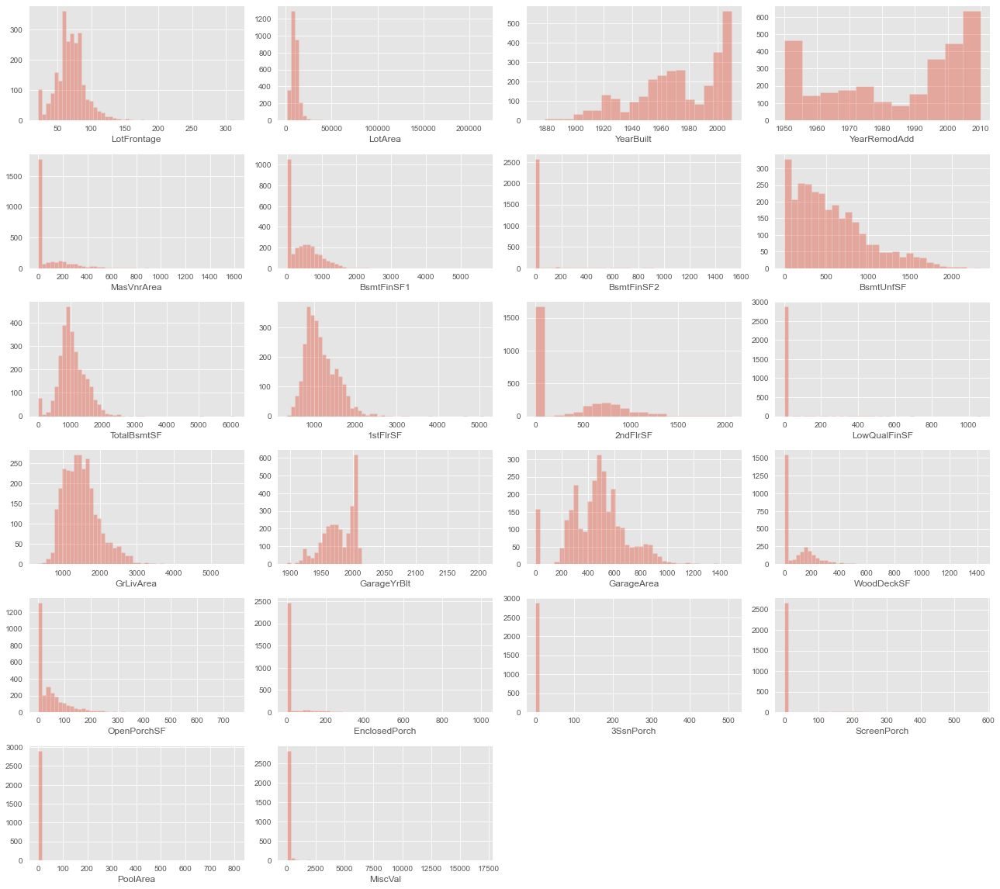

In [ ]:
fig = plt.figure(figsize=(18,16))
for index,col in enumerate(cont_num):
    plt.subplot(6,4,index+1)
    sns.distplot(df_numeric.loc[:,col].dropna(), kde=False)
fig.tight_layout(pad=1.0)

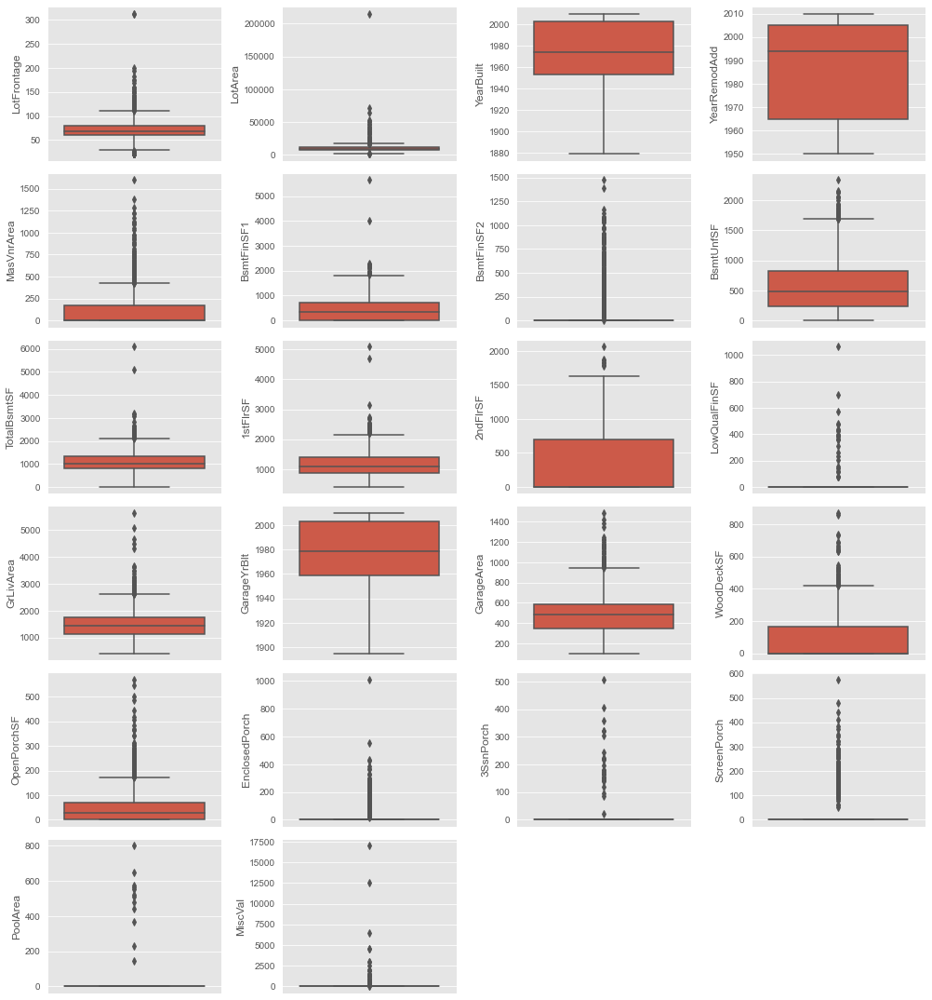

In [ ]:
fig = plt.figure(figsize=(14,15))
for index,col in enumerate(cont_num):
    plt.subplot(6,4,index+1)
    sns.boxplot(y=col, data=df_numeric.dropna())
fig.tight_layout(pad=1.0)

## Discrete Visualization var

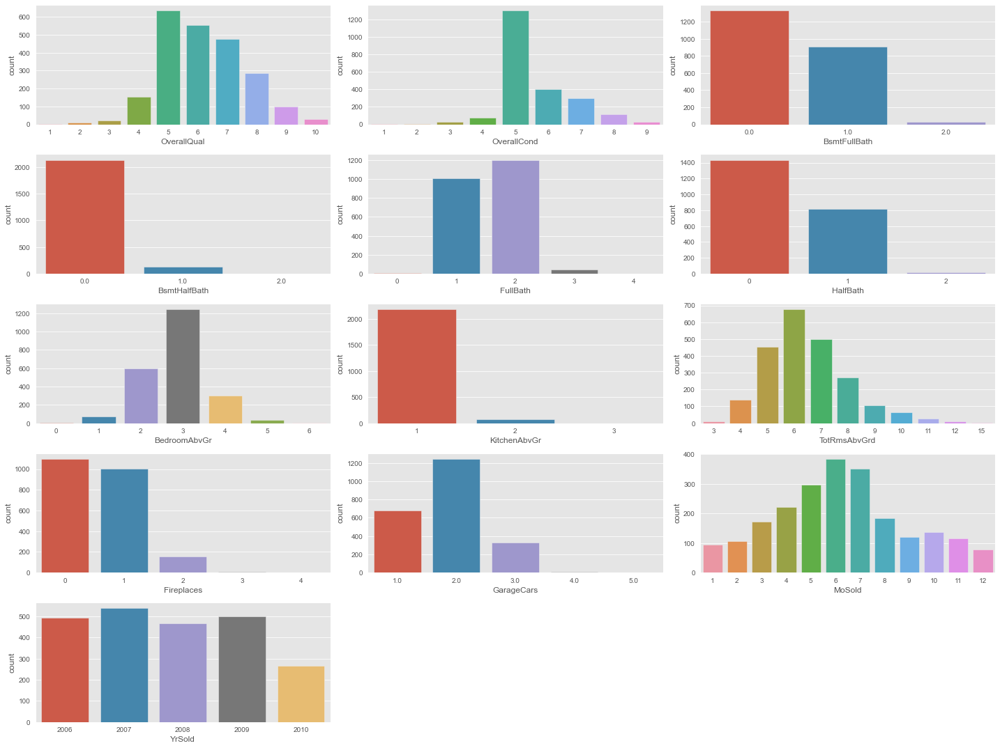

In [ ]:
fig = plt.figure(figsize=(20,15))
for index,col in enumerate(disc_num):
    plt.subplot(5,3,index+1)
    sns.countplot(x=col, data=df_numeric.dropna())
fig.tight_layout(pad=1.0)

## Categorical Visualization

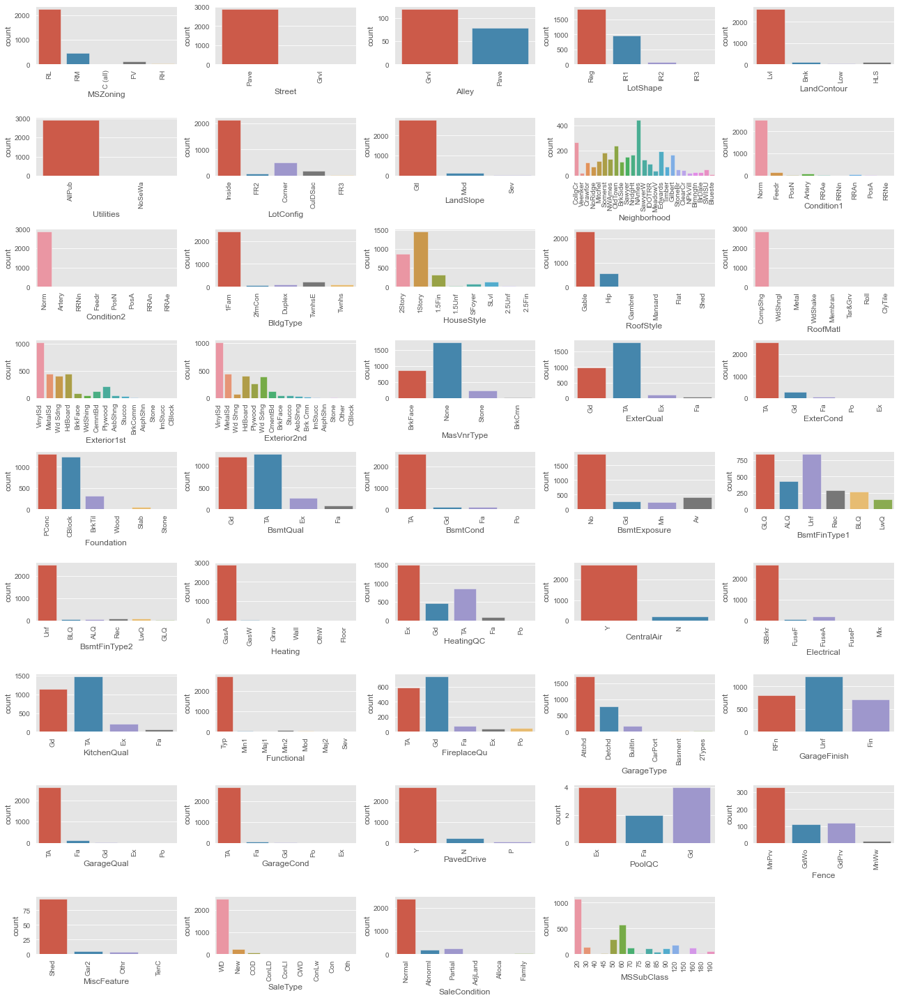

In [ ]:
fig = plt.figure(figsize=(18,20))
for index in range(len(cat_train.columns)):
    plt.subplot(9,5,index+1)
    sns.countplot(x=cat_train.iloc[:,index], data=cat_train.dropna())
    plt.xticks(rotation=90)
fig.tight_layout(pad=1.0)

## Heatmap > 0.8 Correlation

<AxesSubplot:>

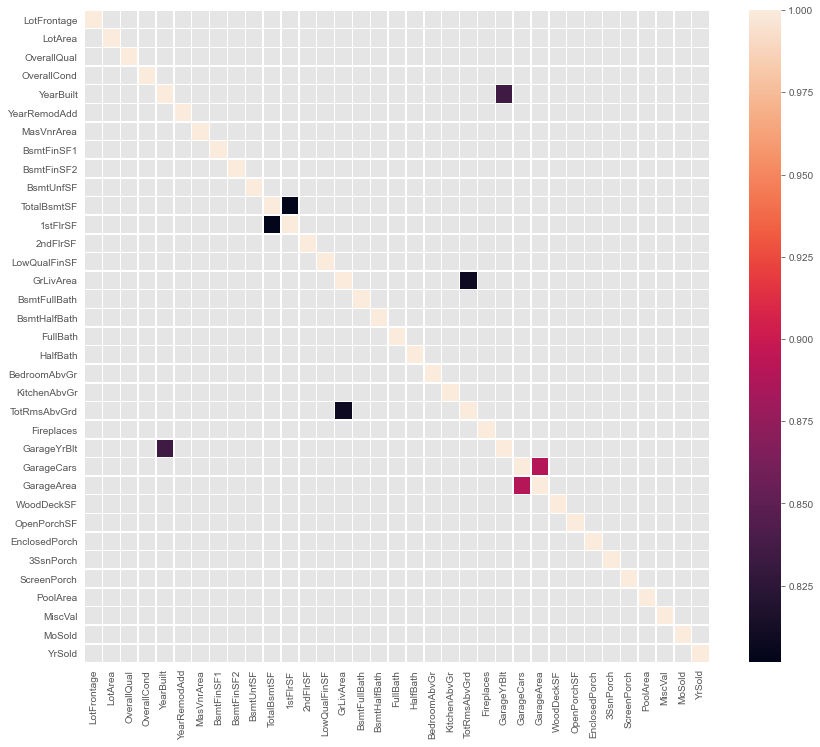

In [ ]:
plt.figure(figsize=(14,12))
correlation = df_numeric.corr()
sns.heatmap(correlation, mask = correlation <0.8, linewidth=0.5, cmap='rocket')

## Correlation Sale Price

In [ ]:
numeric_train = train.select_dtypes(exclude=['object'])
correlation = numeric_train.corr()
correlation[['SalePrice']].sort_values(['SalePrice'], ascending=False)

,SalePrice
SalePrice,1.000000
OverallQual,0.790982
GrLivArea,0.708624
GarageCars,0.640409
GarageArea,0.623431
TotalBsmtSF,0.613581
1stFlrSF,0.605852
FullBath,0.560664
TotRmsAbvGrd,0.533723
YearBuilt,0.522897


## Visulalization Sale Price with Other Numerical Feature

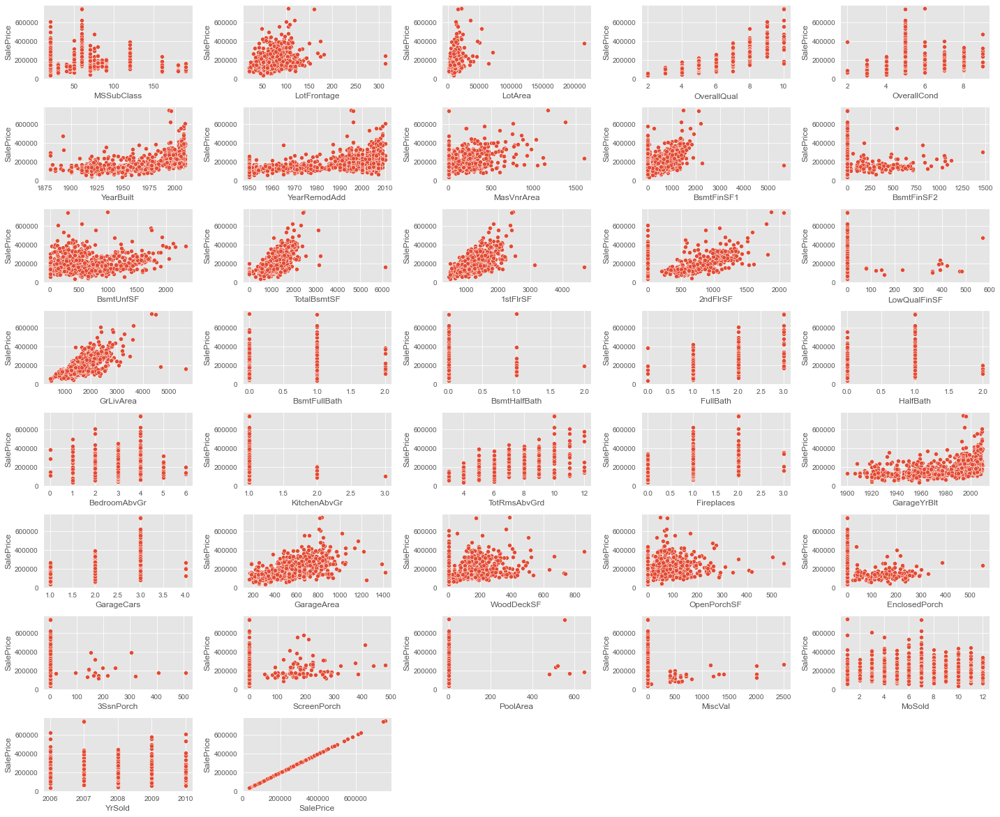

In [ ]:
fig = plt.figure(figsize=(20,20))
for index in range(len(numeric_train.columns)):
    plt.subplot(10,5,index+1)
    sns.scatterplot(x=numeric_train.iloc[:,index], y='SalePrice', data=numeric_train.dropna())
fig.tight_layout(pad=1.0)

In [ ]:
df_numeric

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
Id,,,,,,,,,,,,,,,,,,,,,
1,65.0,8450,7,5,2003,2003,196.0,706.0,0.0,150.0,...,548.0,0,61,0,0,0,0,0,2,2008
2,80.0,9600,6,8,1976,1976,0.0,978.0,0.0,284.0,...,460.0,298,0,0,0,0,0,0,5,2007
3,68.0,11250,7,5,2001,2002,162.0,486.0,0.0,434.0,...,608.0,0,42,0,0,0,0,0,9,2008
4,60.0,9550,7,5,1915,1970,0.0,216.0,0.0,540.0,...,642.0,0,35,272,0,0,0,0,2,2006
5,84.0,14260,8,5,2000,2000,350.0,655.0,0.0,490.0,...,836.0,192,84,0,0,0,0,0,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,21.0,1936,4,7,1970,1970,0.0,0.0,0.0,546.0,...,0.0,0,0,0,0,0,0,0,6,2006
2916,21.0,1894,4,5,1970,1970,0.0,252.0,0.0,294.0,...,286.0,0,24,0,0,0,0,0,4,2006
2917,160.0,20000,5,7,1960,1996,0.0,1224.0,0.0,0.0,...,576.0,474,0,0,0,0,0,0,9,2006


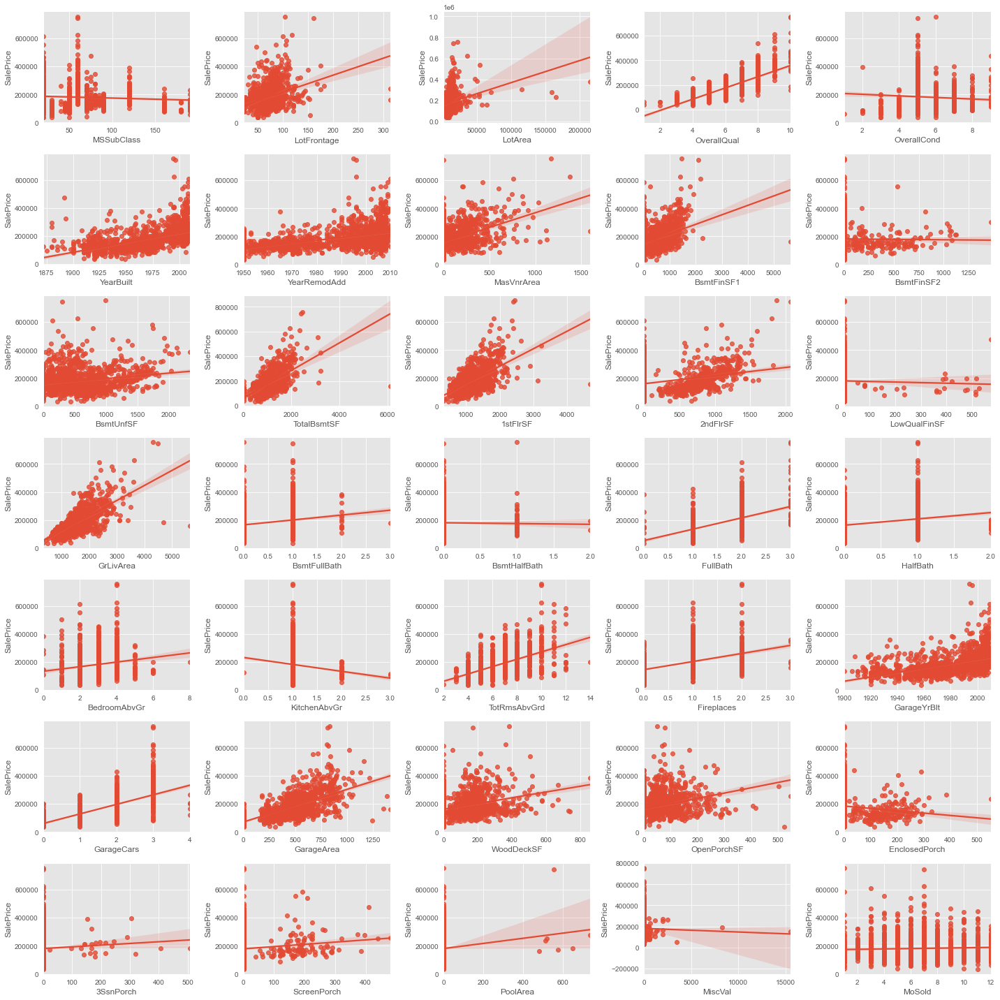

In [ ]:
fig, ax = plt.subplots(round(len(numeric_train.columns) / 5), 5, figsize = (20,20))

for i, ax in enumerate(fig.axes):
    if i < len(numeric_train.columns) - 1:
        sns.regplot(x=numeric_train.columns[i],y='SalePrice', data=train[numeric_train.columns], ax=ax)
fig.tight_layout()
plt.show()

## Target Value Distribution

Skewness: 1.882876
Kurtosis: 6.536282


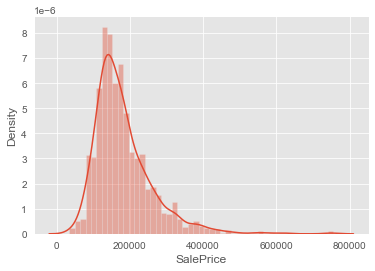

In [ ]:
sns.distplot(train['SalePrice']);
#skewness and kurtosis
print("Skewness: %f" % train['SalePrice'].skew())
print("Kurtosis: %f" % train['SalePrice'].kurt())

## Boxplot

In [ ]:
def plot_sale_boxplot(column) :
    data = pd.concat([train['SalePrice'], train[column]], axis=1)
    f, ax = plt.subplots(figsize=(8, 6))
    fig = sns.boxplot(x=train[column], y="SalePrice", data=data)
    fig.axis();

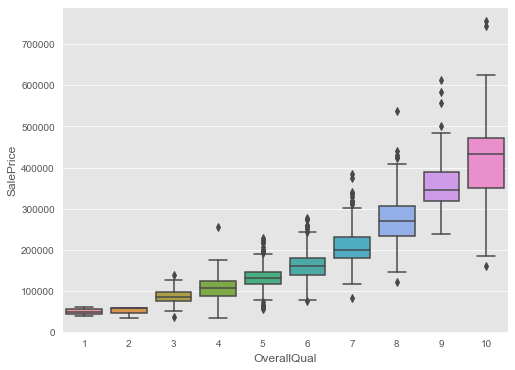

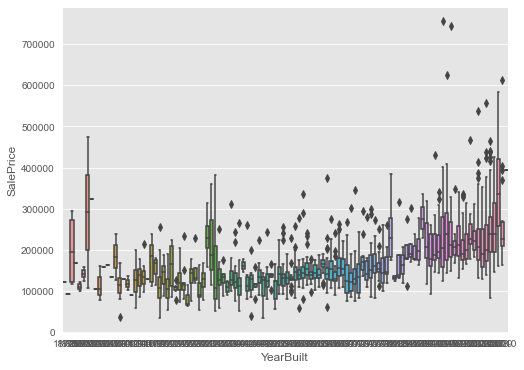

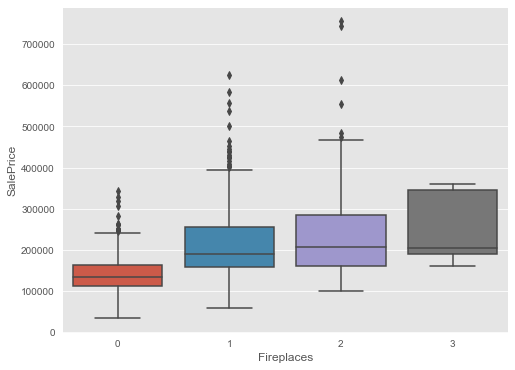

In [ ]:
plot_sale_boxplot('OverallQual')
plot_sale_boxplot('YearBuilt')
plot_sale_boxplot('Fireplaces')

## Scatter Plot

In [ ]:
def plot_sale_scatter(column) :
    data = pd.concat([train['SalePrice'], train[column]], axis=1)
    data.plot.scatter(x=column, y='SalePrice', alpha=0.3);


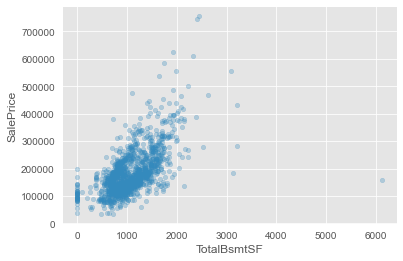

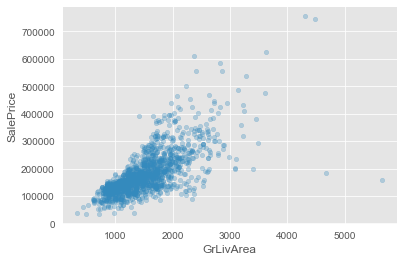

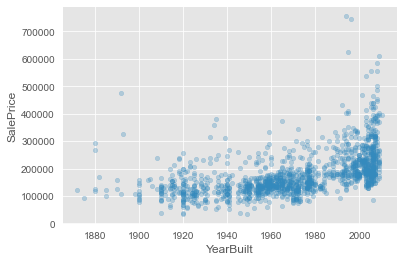

In [ ]:
plot_sale_scatter('TotalBsmtSF')
plot_sale_scatter('GrLivArea')
plot_sale_scatter('YearBuilt')

## Checking Missing Value

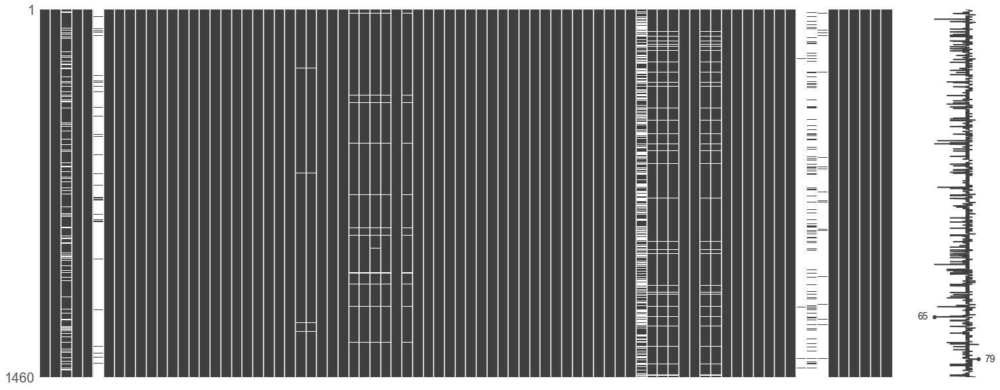

In [ ]:
msno.matrix(train);

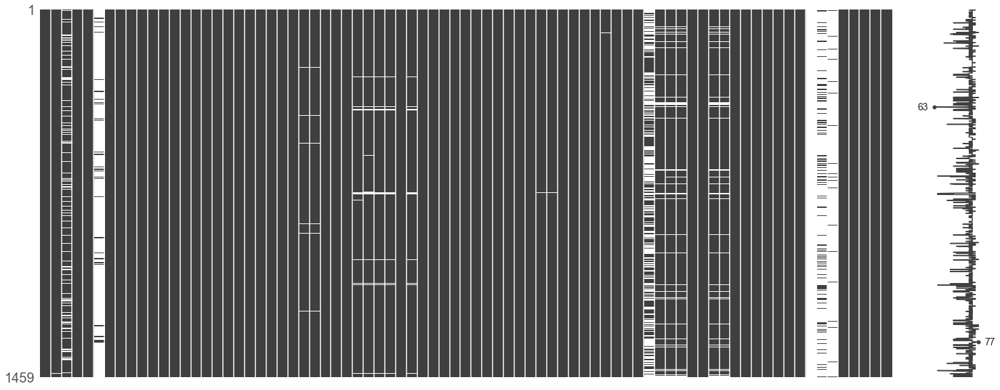

In [ ]:
msno.matrix(test);

In [ ]:
def missing(df):
    miss = pd.DataFrame({"value_remain": (df.shape[0] - df.isnull().sum()),
                         "missing_values_total": df.isnull().sum(),
                         "missing_value_ratio": (df.isnull().sum() / df.shape[0]).round(4),
                         "missing_in_train": train.isnull().sum(),
                         "missing_in_test": test.isnull().sum()})
    return miss[miss.missing_values_total > 0].sort_values("missing_values_total", ascending=False)

missing(df)

,value_remain,missing_values_total,missing_value_ratio,missing_in_train,missing_in_test
PoolQC,10.0,2909.0,0.9966,1453,1456.0
MiscFeature,105.0,2814.0,0.9640,1406,1408.0
Alley,198.0,2721.0,0.9322,1369,1352.0
Fence,571.0,2348.0,0.8044,1179,1169.0
FireplaceQu,1499.0,1420.0,0.4865,690,730.0
LotFrontage,2433.0,486.0,0.1665,259,227.0
GarageCond,2760.0,159.0,0.0545,81,78.0
GarageQual,2760.0,159.0,0.0545,81,78.0
GarageYrBlt,2760.0,159.0,0.0545,81,78.0
GarageFinish,2760.0,159.0,0.0545,81,78.0


# **Data Preprocessing**

## Data Drop Because High Correlation

In [ ]:
df.drop(['GarageYrBlt','TotRmsAbvGrd','1stFlrSF','GarageCars'], axis=1, inplace=True)

## Viz Missing Value

<AxesSubplot:title={'center':'Number of missing rows'}, xlabel='features', ylabel='sum'>

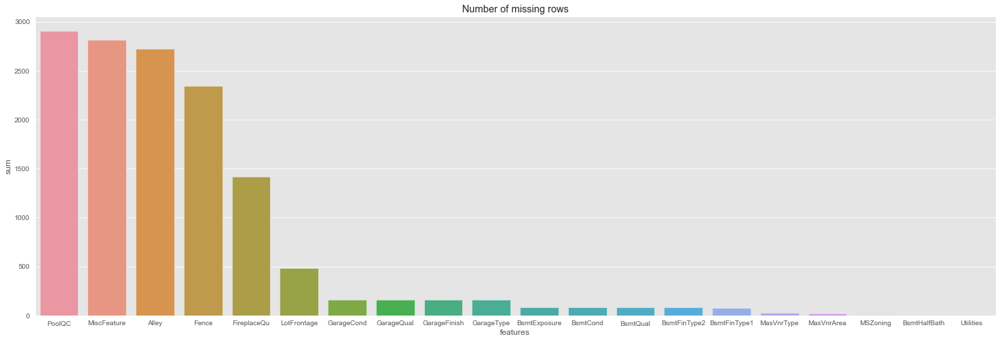

In [ ]:
plt.figure(figsize=(25,8))
plt.title('Number of missing rows')
missing_count = pd.DataFrame(df.isnull().sum(), columns=['sum']).sort_values(by=['sum'],ascending=False).head(20).reset_index()
missing_count.columns = ['features','sum']
sns.barplot(x='features',y='sum', data = missing_count)

In [ ]:
df.drop(['PoolQC','MiscFeature','Alley','Fence'], axis=1, inplace=True)

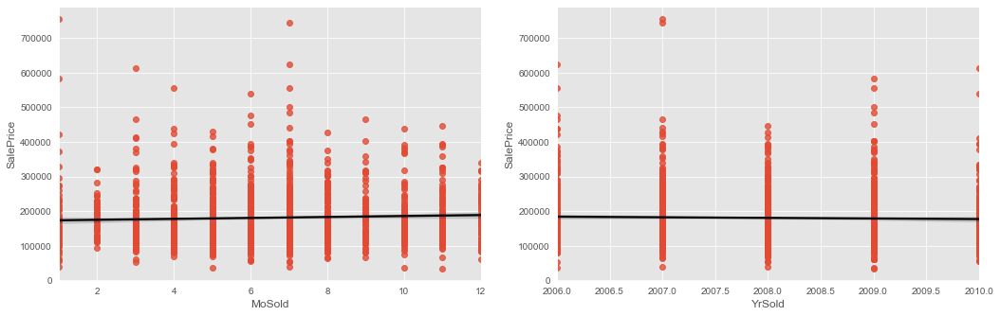

In [ ]:
fig,axes = plt.subplots(1,2, figsize=(15,5))
sns.regplot(x=numeric_train['MoSold'], y='SalePrice', data=numeric_train, ax = axes[0], line_kws={'color':'black'})
sns.regplot(x=numeric_train['YrSold'], y='SalePrice', data=numeric_train, ax = axes[1],line_kws={'color':'black'})
fig.tight_layout(pad=2.0)

In [ ]:
correlation[['SalePrice']].sort_values(['SalePrice'], ascending=False).tail(10)

,SalePrice
3SsnPorch,0.044584
BsmtFinSF2,-0.011378
BsmtHalfBath,-0.016844
MiscVal,-0.021190
LowQualFinSF,-0.025606
YrSold,-0.028923
OverallCond,-0.077856
MSSubClass,-0.084284
EnclosedPorch,-0.128578
KitchenAbvGr,-0.135907


In [ ]:
df.drop(['MoSold','YrSold'], axis=1, inplace=True)

## Removing overfit feature

In [ ]:
cat_col = df.select_dtypes(include=['object']).columns
overfit_cat = []
for i in cat_col:
    counts = df[i].value_counts()
    zeros = counts.iloc[0]
    if zeros / len(df) * 100 > 96:
        overfit_cat.append(i)

overfit_cat = list(overfit_cat)
df = df.drop(overfit_cat, axis=1)

In [ ]:
num_col = df.select_dtypes(exclude=['object']).drop(['MSSubClass'], axis=1).columns
overfit_num = []
for i in num_col:
    counts = df[i].value_counts()
    zeros = counts.iloc[0]
    if zeros / len(df) * 100 > 96:
        overfit_num.append(i)

overfit_num = list(overfit_num)
df = df.drop(overfit_num, axis=1)

In [ ]:
print("Categorical Features with >96% of the same value: ",overfit_cat)
print("Numerical Features with >96% of the same value: ",overfit_num)

Categorical Features with >96% of the same value:  ['Street', 'Utilities', 'Condition2', 'RoofMatl', 'Heating']
Numerical Features with >96% of the same value:  ['LowQualFinSF', '3SsnPorch', 'PoolArea', 'MiscVal']


## Removing Outlier

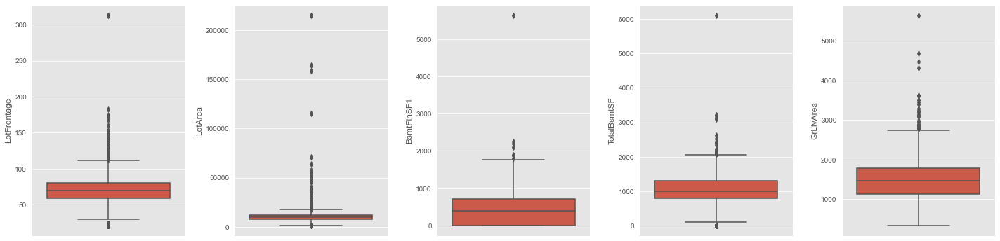

In [ ]:
out_col = ['LotFrontage','LotArea','BsmtFinSF1','TotalBsmtSF','GrLivArea']
fig = plt.figure(figsize=(20,5))
for index,col in enumerate(out_col):
    plt.subplot(1,5,index+1)
    sns.boxplot(y=col, data=train)
fig.tight_layout(pad=1.5)

In [ ]:
train = train.drop(train[train['LotFrontage'] > 200].index)
train = train.drop(train[train['LotArea'] > 100000].index)
train = train.drop(train[train['BsmtFinSF1'] > 4000].index)
train = train.drop(train[train['TotalBsmtSF'] > 5000].index)
train = train.drop(train[train['GrLivArea'] > 4000].index)

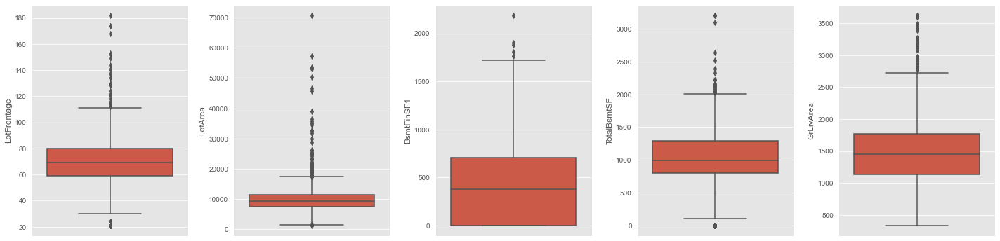

In [ ]:
out_col = ['LotFrontage','LotArea','BsmtFinSF1','TotalBsmtSF','GrLivArea']
fig = plt.figure(figsize=(20,5))
for index,col in enumerate(out_col):
    plt.subplot(1,5,index+1)
    sns.boxplot(y=col, data=train)
fig.tight_layout(pad=1.5)

## Checking Missing Value

In [ ]:
pd.DataFrame(df.isnull().sum(), columns=['sum']).sort_values(by=['sum'],ascending=False).head(15)

,sum
FireplaceQu,1420
LotFrontage,486
GarageQual,159
GarageFinish,159
GarageCond,159
GarageType,157
BsmtCond,82
BsmtExposure,82
BsmtQual,81
BsmtFinType2,80


## Filling Categorical with NA

In [ ]:
cat = ['GarageType','GarageFinish','BsmtFinType2','BsmtExposure','BsmtFinType1', 
       'GarageCond','GarageQual','BsmtCond','BsmtQual','FireplaceQu',"KitchenQual",
       "HeatingQC",'ExterQual','ExterCond']

df[cat] = df[cat].fillna("NA")

In [ ]:
#categorical
cols = ["MasVnrType", "MSZoning", "Exterior1st", "Exterior2nd", "SaleType", "Electrical", "Functional"]
df[cols] = df.groupby("Neighborhood")[cols].transform(lambda x: x.fillna(x.mode()[0]))

In [ ]:
print("Median of LotFrontage: ", df['LotFrontage'].median())
print("Median of GarageArea: ", df['GarageArea'].median())

Mean of LotFrontage:  68.0
Mean of GarageArea:  480.0


## Fillna Median

<AxesSubplot:xlabel='Neighborhood', ylabel='GarageArea_median'>

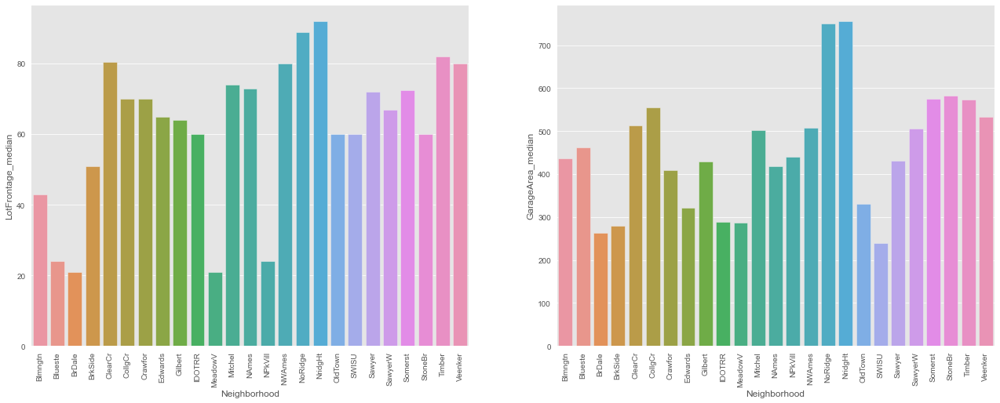

In [ ]:
neigh_lot = df.groupby('Neighborhood')['LotFrontage'].median().reset_index(name='LotFrontage_median')
neigh_garage = df.groupby('Neighborhood')['GarageArea'].median().reset_index(name='GarageArea_median')

fig, axes = plt.subplots(1,2,figsize=(22,8))
axes[0].tick_params(axis='x', rotation=90)
sns.barplot(x='Neighborhood', y='LotFrontage_median', data=neigh_lot, ax=axes[0])
axes[1].tick_params(axis='x', rotation=90)
sns.barplot(x='Neighborhood', y='GarageArea_median', data=neigh_garage, ax=axes[1])

## Fillna with Median

In [ ]:
#for correlated relationship
df['LotFrontage'] = df.groupby('Neighborhood')['LotFrontage'].transform(lambda x: x.fillna(x.median()))
df['GarageArea'] = df.groupby('Neighborhood')['GarageArea'].transform(lambda x: x.fillna(x.median()))

df['MSZoning'] = df.groupby('MSSubClass')['MSZoning'].transform(lambda x: x.fillna(x.mode()[0]))

#numerical
cont = ["BsmtHalfBath", "BsmtFullBath", "BsmtFinSF1", "BsmtFinSF2", "BsmtUnfSF", "TotalBsmtSF", "MasVnrArea"]
df[cont] = df[cont] = df[cont].fillna(df[cont].median())

In [ ]:
df['MSSubClass'] = df['MSSubClass'].apply(str)

## Data Mapping and transorm

In [ ]:
ordinal_map = {'Ex': 5,'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA':0}
fintype_map = {'GLQ': 6,'ALQ': 5,'BLQ': 4,'Rec': 3,'LwQ': 2,'Unf': 1, 'NA': 0}
expose_map = {'Gd': 4, 'Av': 3, 'Mn': 2, 'No': 1, 'NA': 0}

In [ ]:
ord_col = ['ExterQual','ExterCond','BsmtQual', 'BsmtCond','HeatingQC','KitchenQual','GarageQual','GarageCond', 'FireplaceQu']
for col in ord_col:
    df[col] = df[col].map(ordinal_map)
    
fin_col = ['BsmtFinType1','BsmtFinType2']
for col in fin_col:
    df[col] = df[col].map(fintype_map)

df['BsmtExposure'] = df['BsmtExposure'].map(expose_map)

# **Feature Engineering**

## **Feature Join**

In [ ]:
df['TotalLot'] = df['LotFrontage'] + df['LotArea']
df['TotalBsmtFin'] = df['BsmtFinSF1'] + df['BsmtFinSF2']
df['TotalSF'] = df['TotalBsmtSF'] + df['2ndFlrSF']
df['TotalBath'] = df['FullBath'] + df['HalfBath']
df['TotalPorch'] = df['OpenPorchSF'] + df['EnclosedPorch'] + df['ScreenPorch']

In [ ]:
colum = ['MasVnrArea','TotalBsmtFin','TotalBsmtSF','2ndFlrSF','WoodDeckSF','TotalPorch']

for col in colum:
    col_name = col+'_bin'
    df[col_name] = df[col].apply(lambda x: 1 if x > 0 else 0)

In [ ]:
df = pd.get_dummies(df)

## **Transformation Skew**

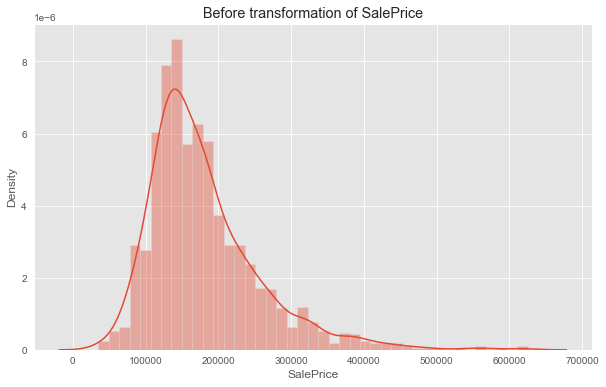

In [ ]:
plt.figure(figsize=(10,6))
plt.title("Before transformation of SalePrice")
dist = sns.distplot(train['SalePrice'],norm_hist=False)

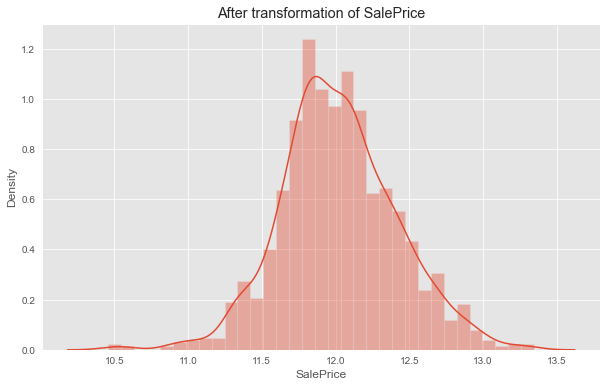

In [ ]:
plt.figure(figsize=(10,6))
plt.title("After transformation of SalePrice")
dist = sns.distplot(np.log(train['SalePrice']),norm_hist=False)

In [ ]:
df_y["SalePrice"] = np.log(df_y['SalePrice'])

In [ ]:
df_y["SalePrice"]

Id
1       12.247694
2       12.109011
3       12.317167
4       11.849398
5       12.429216
          ...    
1456    12.072541
1457    12.254863
1458    12.493130
1459    11.864462
1460    11.901583
Name: SalePrice, Length: 1460, dtype: float64

# **Modelling**

## **Data Splitting**

In [ ]:
x = df.loc[train.index]
y = df_y.loc[train.index]
test = df.loc[test.index]

In [ ]:
cols = x.select_dtypes(np.number).columns
transformer = RobustScaler().fit(x[cols])

x[cols] = transformer.transform(x[cols])
test[cols] = transformer.transform(test[cols])

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(x, y, test_size=0.2, random_state=42)

## **Create Model**

In [ ]:
# XGBoost Regressor
xgb =XGBRegressor( booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.6, gamma=0,
             importance_type='gain', learning_rate=0.01, max_delta_step=0,
             max_depth=4, min_child_weight=1.5, n_estimators=2400,
             n_jobs=1, nthread=None, objective='reg:linear',
             reg_alpha=0.6, reg_lambda=0.6, scale_pos_weight=1, 
             silent=None, subsample=0.8, verbosity=1, random_state=42)

# LGBMRegressor
lgbm = LGBMRegressor(objective='regression', 
                                       num_leaves=4,
                                       learning_rate=0.01, 
                                       n_estimators=12000, 
                                       max_bin=200, 
                                       bagging_fraction=0.75,
                                       bagging_freq=5, 
                                       bagging_seed=7,
                                       feature_fraction=0.4,
                                       random_state=42
                                       )                       

# Random Forest Regressor
rf = RandomForestRegressor(n_estimators=1200,
                          max_depth=15,
                          min_samples_split=5,
                          min_samples_leaf=5,
                          max_features=None,
                          oob_score=True,
                          random_state=42)

# StackingCVRegressor
stack_gen = StackingCVRegressor(regressors=(xgb, lgbm, rf),
                                meta_regressor=xgb,
                                )
# use_features_in_secondary=True

## **Cross Validating and Fitting**

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import cross_val_score

In [ ]:
def mean_cross_val(model, X, y):
    score = cross_val_score(model, X, y, cv=5)
    mean = score.mean()
    return mean


xgb.fit(X_train, y_train)   
preds = xgb.predict(X_val) 
preds_test_xgb = xgb.predict(test)
mae_xgb = mean_absolute_error(y_val, preds)
rmse_xgb = np.sqrt(mean_squared_error(y_val, preds))
score_xgb = xgb.score(X_val, y_val)
cv_xgb = mean_cross_val(xgb, x, y)


lgbm.fit(X_train, y_train)   
preds = lgbm.predict(X_val) 
preds_test_lgbm = lgbm.predict(test)
mae_lgbm = mean_absolute_error(y_val, preds)
rmse_lgbm = np.sqrt(mean_squared_error(y_val, preds))
score_lgbm = lgbm.score(X_val, y_val)
cv_lgbm = mean_cross_val(lgbm, x, y)

rf.fit(X_train, y_train)   
preds = rf.predict(X_val) 
preds_test_rf = rf.predict(test)
mae_rf = mean_absolute_error(y_val, preds)
rmse_rf = np.sqrt(mean_squared_error(y_val, preds))
score_rf = rf.score(X_val, y_val)
cv_rf = mean_cross_val(rf, x, y)


[00:55:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[00:55:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[00:55:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[00:56:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[00:56:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[00:56:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:17

In [ ]:
model_performances = pd.DataFrame({
    "Model" : ["XGBoost", "LGBM", "RandomForest"],
    "CV(5)" : [str(cv_xgb)[0:5], str(cv_lgbm)[0:5], str(cv_rf)[0:5]],
    "MAE" : [str(mae_xgb)[0:5], str(mae_lgbm)[0:5], str(mae_rf)[0:5]],
    "RMSE" : [str(rmse_xgb)[0:5], str(rmse_lgbm)[0:5], str(rmse_rf)[0:5]],
    "Score" : [str(score_xgb)[0:5], str(score_lgbm)[0:5], str(score_rf)[0:5]]
})

print("Sorted by Score:")
print(model_performances.sort_values(by="Score", ascending=False))

Sorted by Score:
          Model  CV(5)    MAE   RMSE  Score
0       XGBoost  0.914  0.085  0.129  0.889
1          LGBM  0.910  0.086  0.136  0.877
2  RandomForest  0.874  0.098  0.151  0.849


## **Blending**

In [ ]:
def blended_predictions(X):
    return ((0.4 * xgb.predict(X)) + \
            (0.3 * lgbm.predict(X)) + \
            (0.3 * rf.predict(X)))

In [ ]:
def rmsle(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

In [ ]:
blended_score = rmsle(y, blended_predictions(x))
scores = {}
scores['blended'] = (blended_score)
print('RMSLE score on train data:')
print(blended_score)

RMSLE score on train data:
0.07887220681857181


## **Model Score Comparing**

In [ ]:
rmse_model = {'lgbm' : rmse_lgbm,'rf':rmse_rf, 'xgb':rmse_xgb}

In [ ]:
scores.update(rmse_model)

Text(0.5, 1.0, 'Scores of Models')

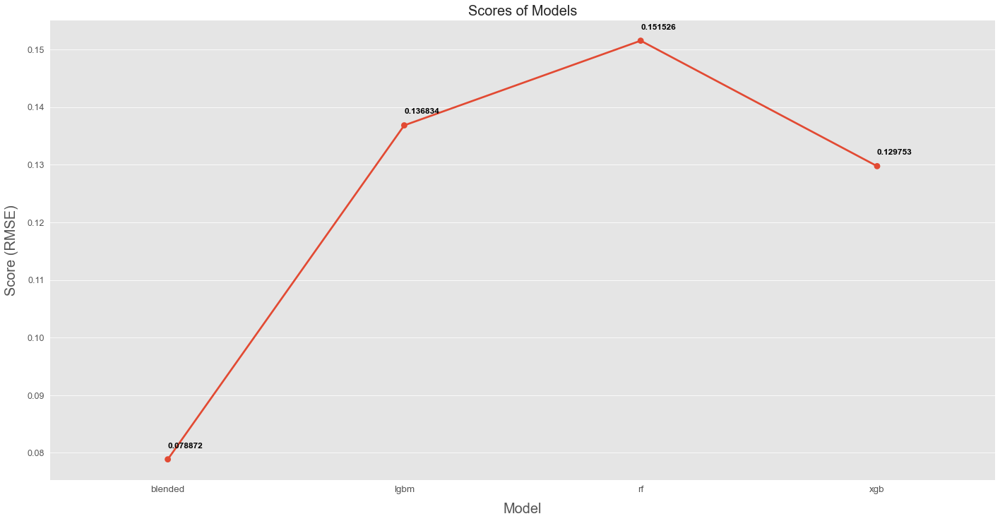

In [ ]:
fig = plt.figure(figsize=(24, 12))

ax = sns.pointplot(x=list(scores.keys()), y=[score for score in scores.values()], markers=['o'], linestyles=['-'])
for i, score in enumerate(scores.values()):
    ax.text(i, score + 0.002, '{:.6f}'.format(score), horizontalalignment='left', size='large', color='black', weight='semibold')


plt.ylabel('Score (RMSE)', size=20, labelpad=12.5)
plt.xlabel('Model', size=20, labelpad=12.5)
plt.tick_params(axis='x', labelsize=13.5)
plt.tick_params(axis='y', labelsize=12.5)

plt.title('Scores of Models', size=20)


## **Submission**

In [ ]:
subm = np.exp(blended_predictions(test))
submission = pd.DataFrame({'Id': test.index,
                           'SalePrice': subm})
submission.to_csv('test_sale.csv', index=False)
#submission.to_csv("../../kaggle/working/submission.csv", index=False)